# ADA/USD Price Forecast Model
Analysis to determine the ideal model to predict future ADA prices.

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

## Helper Functions

In [2]:
def adf_test(series):
    result = adfuller(series)
    print("ADF Statistic: %f" % result[0])
    print("p-value: %f" % result[1])

In [61]:
def print_model_parameters(model):
    try:
        print("AR Params: %s" % model.arparams)
    except AttributeError:
        print("AR Params: None")

    try:
        print("MA Params: %s" % model.maparams)
    except AttributeError:
        print("MA Params: None")

In [62]:
def print_information_criterias(models, priority):
    models.sort(key=priority, reverse=False)
    print("First model - AIC: %s, BIC: %s" % (models[0].aic, models[0].bic))
    print("Last model - AIC: %s, BIC: %s" % (models[-1].aic, models[-1].bic))

In [3]:
# ignore warning messages
import warnings
warnings.filterwarnings("ignore")

## Import Data

In [6]:
ada_usd = pd.read_csv("ADA-USD_1y200715d.csv", parse_dates=[0], index_col=0, squeeze=True, date_parser=lambda s: datetime.strptime(s, "%Y-%m-%d")).dropna()
ada_usd.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-07-15,0.131996,0.132421,0.127560,0.130369,0.130369,292680349.0
2020-07-16,0.130397,0.132458,0.119481,0.125922,0.125922,423824352.0
2020-07-17,0.125964,0.126491,0.121946,0.122486,0.122486,231984863.0
2020-07-18,0.122307,0.124315,0.118482,0.122477,0.122477,221333950.0
2020-07-19,0.122484,0.124557,0.121218,0.123712,0.123712,159010744.0


In [18]:
ada_usd_close = ada_usd.drop(columns=["Open", "High", "Low", "Adj Close", "Volume"]).dropna()
ada_usd_close.head()

,Close
Date,
2020-07-15,0.130369
2020-07-16,0.125922
2020-07-17,0.122486
2020-07-18,0.122477
2020-07-19,0.123712


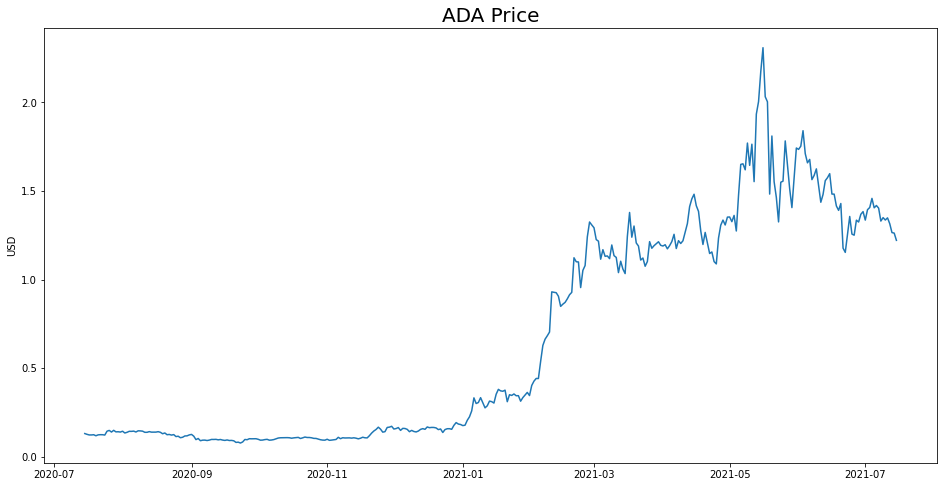

In [19]:
plt.figure(figsize=(16, 8))
plt.title("ADA Price", fontsize=20)
plt.ylabel("USD")
plt.plot(ada_usd_close.Close)

## Normalization

In [20]:
mean_close, std_close = ada_usd_close.Close.mean(), ada_usd_close.Close.std()

# z-score normalization
ada_usd_close["Close"] = (ada_usd_close.Close - mean_close) / std_close

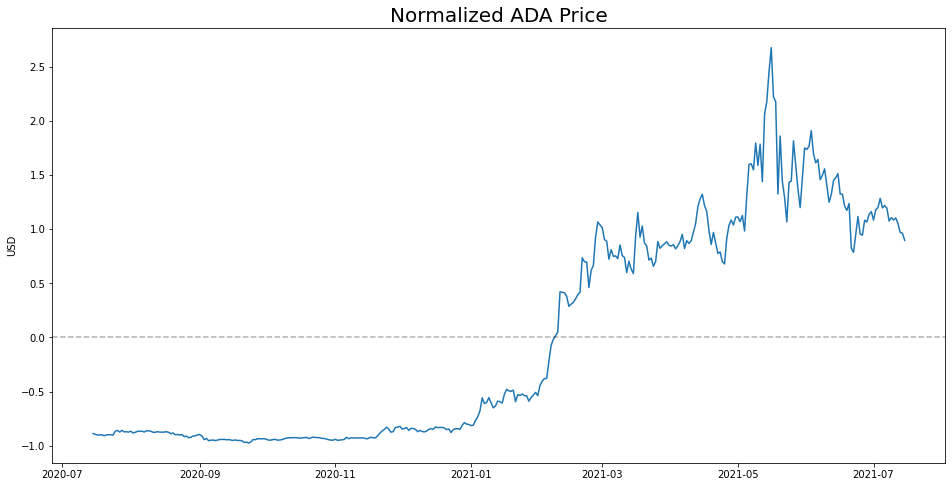

In [22]:
plt.figure(figsize=(16, 8))
plt.title("Normalized ADA Price", fontsize=20)
plt.ylabel("USD")
plt.plot(ada_usd_close.Close)
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

## Stationarize

### First Difference

In [23]:
ada_usd_close["Diff_1"] = ada_usd_close.Close.diff().dropna()

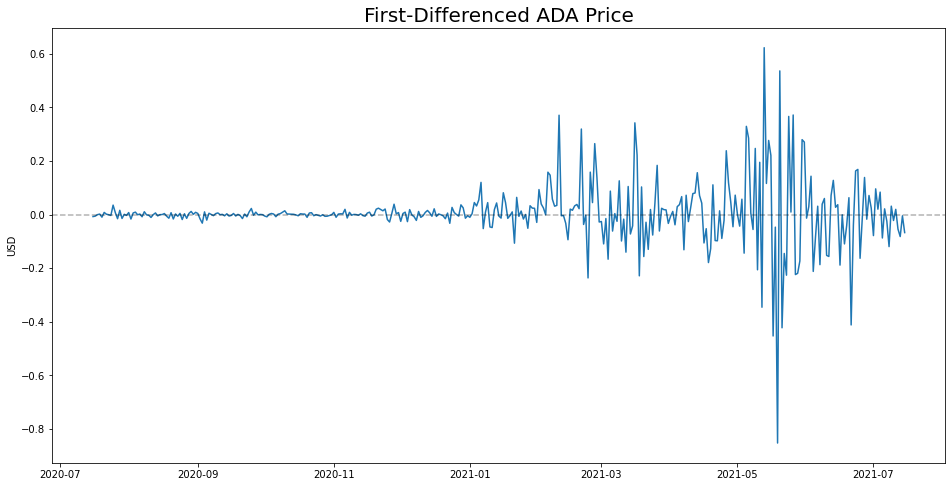

In [24]:
plt.figure(figsize=(16, 8))
plt.title("First-Differenced ADA Price", fontsize=20)
plt.ylabel("USD")
plt.plot(ada_usd_close.Diff_1)
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

### ADF-Test for First Differenced ADA Price

In [25]:
adf_test(ada_usd_close.Diff_1.dropna())

ADF Statistic: -6.236153
p-value: 0.000000


### ACF for First Differenced ADA Price

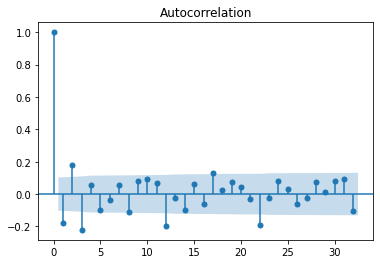

In [27]:
plot_acf(ada_usd_close.Diff_1.dropna(), lags=32)
plt.show()

## MA(1), MA(2), MA(3), MA(8), MA(12), MA(17), MA(22)

### PACF for First Differenced ADA Price

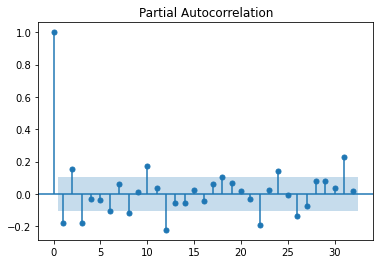

In [28]:
plot_pacf(ada_usd_close.Diff_1.dropna(), lags=32)
plt.show()

## AR(1), AR(2), AR(3), AR(6), AR(8), AR(10), AR(12), AR(18), AR(22), AR(24), AR(26), AR(31)

## Predictions for First Differenced ADA Price

In [29]:
p_params = [1, 2, 3, 6, 8, 10, 12, 18, 22, 24, 26, 31]
q_params = [1, 2, 3, 8, 12, 17, 22]
models = list()

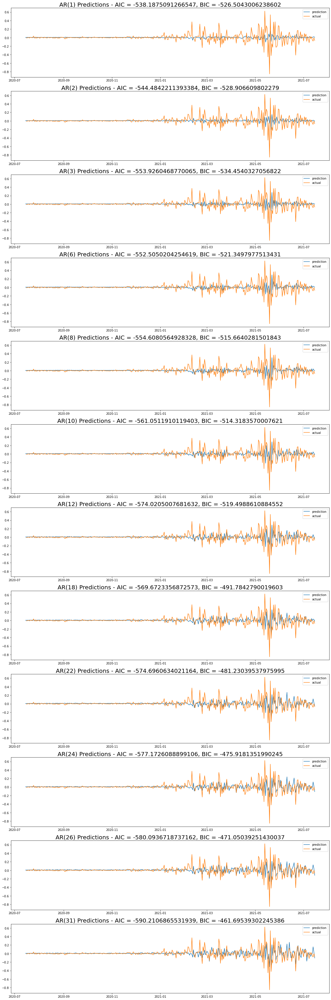

In [31]:
# AR models
plt.figure(figsize=(16, len(p_params) * 4))
for i, p in enumerate(p_params):
    model = ARIMA(ada_usd_close.Diff_1, order=(p, 0, 0))
    model_fit = model.fit()
    models.append(model_fit)
    plt.subplot(len(p_params), 1, i + 1)
    plt.title("AR(%s) Predictions - AIC = %s, BIC = %s" % (p, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(ada_usd_close.Diff_1, label="actual")
    plt.legend()
plt.tight_layout()

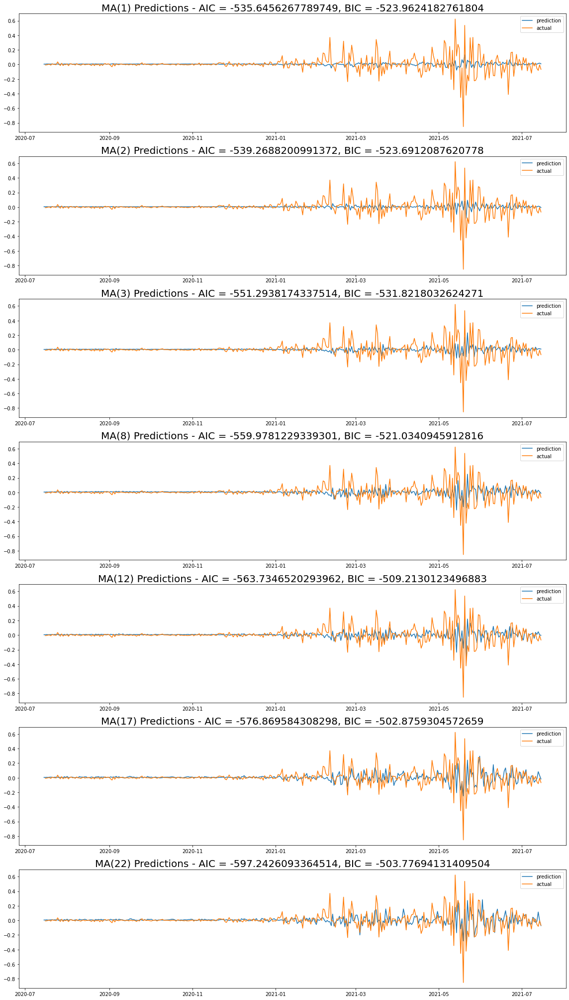

In [32]:
# MA models
plt.figure(figsize=(16, len(q_params) * 4))
for i, q in enumerate(q_params):
    model = ARIMA(ada_usd_close.Diff_1, order=(0, 0, q))
    model_fit = model.fit()
    models.append(model_fit)
    plt.subplot(len(q_params), 1, i + 1)
    plt.title("MA(%s) Predictions - AIC = %s, BIC = %s" % (q, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(ada_usd_close.Diff_1, label="actual")
    plt.legend()
plt.tight_layout()

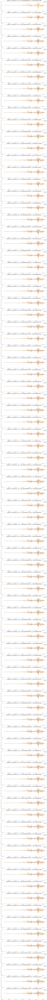

In [33]:
# ARMA models
plt.figure(figsize=(16, len(p_params) * len(q_params) * 4))
idx = 0
for i, p in enumerate(p_params):
    for j, q in enumerate(q_params):
        idx += 1
        model = ARIMA(ada_usd_close.Diff_1, order=(p, 0, q))
        model_fit = model.fit()
        models.append(model_fit)
        plt.subplot(len(p_params) * len(q_params), 1, idx)
        plt.title("ARMA(%s, %s) Predictions - AIC = %s, BIC = %s" % (p, q, model_fit.aic, model_fit.bic), fontsize=20)
        plt.plot(model_fit.fittedvalues, label="prediction")
        plt.plot(ada_usd_close.Diff_1, label="actual")
        plt.legend()
plt.tight_layout()

## 12 AR Models, 7 MA Models, 84 ARMA Models

In [34]:
len(models)

103

In [63]:
print_information_criterias(models, priority=lambda m: m.bic)

First model - AIC: -553.9260468770065, BIC: -534.4540327056822
Last model - AIC: -581.1438465897373, BIC: -366.95169070517056


In [64]:
print_information_criterias(models, priority=lambda m: m.aic)

First model - AIC: -600.3462836923904, BIC: -475.72539299591523
Last model - AIC: -524.3759497588093, BIC: -508.79833842174986


In [65]:
optimal_model = models[0]

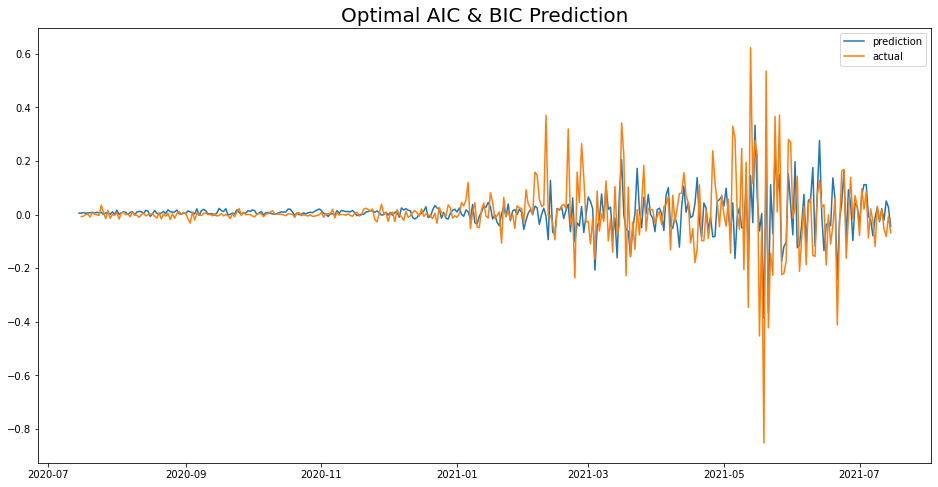

In [66]:
plt.figure(figsize=(16, 8))
plt.title("Optimal AIC & BIC Prediction", fontsize=20)
plt.plot(optimal_model.fittedvalues, label="prediction")
plt.plot(ada_usd_close.Diff_1, label="actual")
plt.legend()

In [68]:
print_model_parameters(optimal_model)

AR Params: [ 0.15874558 -0.16267556 -0.03940306  0.20191307 -0.18675949 -0.10256106
  0.05229861 -0.53890459]
MA Params: [-0.36166142  0.43229409 -0.22422611 -0.04516895  0.13677731  0.03736691
  0.04223204  0.39214397  0.00604596  0.16183098 -0.02261742  0.01264601
 -0.10842837 -0.18667335  0.02467632 -0.19525307  0.23634647  0.03237897
  0.19589192  0.04068317 -0.13191664 -0.37069879]


## ARMA(8, 22) is the optimal model for this prediction
## ARIMA(8, 1, 22) is the optimal model for the raw data